In [32]:
from IPython.display import display, Markdown
import pandas as pd
import os 
import plotly

import cufflinks as cf
from pivottablejs import pivot_ui
import plotly.offline
import json
import statsmodels.api as sm
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)
%matplotlib inline

sourceUrl = os.getcwd().split('work')[0] + 'work/datasets/i2i/newDatav7'

# Mobile gender data

The data was collected through SMS and short questions through i2i.

The purpose of collecting the data is too look at different areas of economic empowerment that may differ across men and women and within men and women by things like age, education, area etc.



We broke this down into:

* Mobile phone indicators – because this could be an empowering asset
* Financial inclusion indicators
* Indicators that look at control and decision-making
* Earning and spending
* Spouse work
 

There are 20 indicators are ordered in those categories and it should be easy to group them accordingly.

or alternatively, you can break the categories into something else if you guys feel it tells the story better.

**note:** to be displayed on the platform we will require the actual values for each category not their code; but for exploratory pourposes we can work with the codes

Alicia Questions:
* The metadata for the columns and their codes

## Exploratory Phase

In [2]:
dataset = pd.read_csv(f'{sourceUrl}/200204 i2i_Gender Content Survey_ Kenya F2F Weighted Data[1].csv',decimal=',', sep=';')

In [3]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 36 columns):
InstanceID                   3000 non-null int64
finalweight                  3000 non-null float64
gender                       3000 non-null int64
Relationship_status          3000 non-null int64
UR                           3000 non-null int64
age_group                    3000 non-null int64
edu_reduced                  3000 non-null int64
literacy_binary_English      3000 non-null int64
own_phone                    3000 non-null int64
ppi_cutoff                   3000 non-null int64
Lang_interview               3000 non-null int64
MainLang                     3000 non-null int64
HHmean                       3000 non-null int64
Region                       3000 non-null int64
County                       3000 non-null object
Province                     3000 non-null object
I1_PhoneOwner                3000 non-null int64
I2_IndepPhoneUse             3000 non-null int64
I3_Info

In [4]:
poblacion = sum(dataset['finalweight'])
mujeres = dataset[dataset['gender'] == 1]
total_mujeres = sum(mujeres['finalweight'])
hombres = dataset[dataset['gender'] == 2]
total_hombres = sum(hombres['finalweight'])
print('Mujeres: ',total_mujeres)
print('Hombres: ',total_hombres)
print('Total: ', poblacion)

Mujeres:  10705085.832735473
Hombres:  11265010.970281385
Total:  21970096.803016882


In [5]:
dataset.describe()

,InstanceID,finalweight,gender,Relationship_status,UR,age_group,edu_reduced,literacy_binary_English,own_phone,ppi_cutoff,...,I11_LandDecide,I12_ChildrenDecide,I13_Workfreq,I14_DecideSpend,I15_PermissToWork,I16_main_earner,I17_MigrantWork,I18_FinHealth,I19_spouseinc,I20_SpousePermissToWork
count,3000.000000,3000.000000,3000.000000,3000.000000,3000.00000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,...,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
mean,775219.861000,7323.365601,1.577000,1.299667,1.64000,2.464667,2.661333,1.874333,1.110000,0.499333,...,2.838667,3.644000,3.506667,1.265333,2.678333,1.926667,1.869000,2.854333,4.131333,2.907667
std,2804.730373,6821.957573,0.494118,0.458188,0.48008,1.269628,0.832788,0.331529,0.312942,0.500083,...,1.273779,1.928169,1.840403,0.525062,0.550422,1.095607,1.285713,1.063716,2.674410,1.324283
min,770458.000000,119.347640,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,773091.750000,3513.723858,1.000000,1.000000,1.00000,1.000000,2.000000,2.000000,1.000000,0.000000,...,1.000000,2.000000,1.000000,1.000000,2.000000,1.000000,1.000000,2.000000,1.000000,1.000000
50%,774943.500000,6031.078588,2.000000,1.000000,2.00000,2.000000,3.000000,2.000000,1.000000,0.000000,...,3.000000,3.000000,4.000000,1.000000,3.000000,2.000000,1.000000,3.000000,3.000000,4.000000
75%,777020.250000,8937.020108,2.000000,2.000000,2.00000,3.000000,3.000000,2.000000,1.000000,1.000000,...,4.000000,6.000000,5.000000,1.000000,3.000000,2.000000,3.000000,4.000000,6.000000,4.000000
max,788781.000000,91545.839640,2.000000,2.000000,2.00000,5.000000,5.000000,2.000000,2.000000,1.000000,...,4.000000,6.000000,6.000000,3.000000,3.000000,7.000000,4.000000,4.000000,8.000000,4.000000


In [6]:
for column in dataset:
    display(Markdown(f'#### {column}'))
    #print(dataset[column].unique())
    print(dataset.groupby(column)[column].count())
    print('_________________________________________________________')

#### InstanceID

InstanceID
770458    1
770459    1
770471    1
770485    1
770486    1
         ..
788542    1
788755    1
788762    1
788776    1
788781    1
Name: InstanceID, Length: 3000, dtype: int64
_________________________________________________________


#### finalweight

finalweight
119.347640      1
233.005960      2
324.475109      1
427.962014      3
586.768724      1
               ..
71589.293750    1
73626.007970    1
76351.052250    1
83608.643210    1
91545.839640    2
Name: finalweight, Length: 1141, dtype: int64
_________________________________________________________


#### gender

gender
1    1269
2    1731
Name: gender, dtype: int64
_________________________________________________________


#### Relationship_status

Relationship_status
1    2101
2     899
Name: Relationship_status, dtype: int64
_________________________________________________________


#### UR

UR
1    1080
2    1920
Name: UR, dtype: int64
_________________________________________________________


#### age_group

age_group
1     771
2    1021
3     567
4     325
5     316
Name: age_group, dtype: int64
_________________________________________________________


#### edu_reduced

edu_reduced
1     196
2    1126
3    1182
4     490
5       6
Name: edu_reduced, dtype: int64
_________________________________________________________


#### literacy_binary_English

literacy_binary_English
1     377
2    2623
Name: literacy_binary_English, dtype: int64
_________________________________________________________


#### own_phone

own_phone
1    2670
2     330
Name: own_phone, dtype: int64
_________________________________________________________


#### ppi_cutoff

ppi_cutoff
0    1502
1    1498
Name: ppi_cutoff, dtype: int64
_________________________________________________________


#### Lang_interview

Lang_interview
1     1495
2      913
3       94
4       91
5       34
6       66
7       38
8       96
9       13
10     160
Name: Lang_interview, dtype: int64
_________________________________________________________


#### MainLang

MainLang
1       28
2     1171
3      235
4      270
5      154
6      132
7      112
8      242
9      142
10     290
12      20
13       7
14       1
15       2
18      34
19      15
20      55
21       9
22      18
23       7
24      15
25      14
26      15
27       2
28       1
29       7
30       2
Name: MainLang, dtype: int64
_________________________________________________________


#### HHmean

HHmean
1    1241
2     552
3    1207
Name: HHmean, dtype: int64
_________________________________________________________


#### Region

Region
1    320
2    230
3    430
4    230
5    340
6    440
7    700
8    310
Name: Region, dtype: int64
_________________________________________________________


#### County

County
       90
1      60
10     70
11    120
12     50
13    110
14     69
15     40
16     90
17     80
18     90
19     50
2      60
21     10
22    100
23     80
24    130
26    110
27     80
28     71
29     70
3      91
30    230
31    130
32     60
33     60
34     40
35     50
36     50
38     70
39     30
4      59
42     70
43     50
44     90
45     40
46    120
6      50
8      80
Name: County, dtype: int64
_________________________________________________________


#### Province

Province
      90
1    320
2    230
3    430
4    230
5    250
6    440
7    700
8    310
Name: Province, dtype: int64
_________________________________________________________


#### I1_PhoneOwner

I1_PhoneOwner
1    2670
2     121
3      49
4      30
5      22
6      39
7      69
Name: I1_PhoneOwner, dtype: int64
_________________________________________________________


#### I2_IndepPhoneUse

I2_IndepPhoneUse
1    2588
2     243
3     100
4      69
Name: I2_IndepPhoneUse, dtype: int64
_________________________________________________________


#### I3_InformalFinancialUsage

I3_InformalFinancialUsage
1     985
3    2015
Name: I3_InformalFinancialUsage, dtype: int64
_________________________________________________________


#### I4_MM

I4_MM
1    2561
2     302
3      68
4      69
Name: I4_MM, dtype: int64
_________________________________________________________


#### I5_bank_consol

I5_bank_consol
1    1288
2      33
3      18
4      20
5    1641
Name: I5_bank_consol, dtype: int64
_________________________________________________________


#### I6_OpeningPermission

I6_OpeningPermission
1     630
3    2370
Name: I6_OpeningPermission, dtype: int64
_________________________________________________________


#### I7_MoneyTaken

I7_MoneyTaken
0     110
1     189
2    2701
Name: I7_MoneyTaken, dtype: int64
_________________________________________________________


#### I8_savGoalDec_consol

I8_savGoalDec_consol
1    2020
2     276
3     229
5     475
Name: I8_savGoalDec_consol, dtype: int64
_________________________________________________________


#### I9_savGoalInfl

I9_savGoalInfl
1     445
2    1009
3    1013
4      58
5     475
Name: I9_savGoalInfl, dtype: int64
_________________________________________________________


#### I10_LandOwn

I10_LandOwn
1    1046
2     495
3    1459
Name: I10_LandOwn, dtype: int64
_________________________________________________________


#### I11_LandDecide

I11_LandDecide
1     771
2     401
3     369
4    1459
Name: I11_LandDecide, dtype: int64
_________________________________________________________


#### I12_ChildrenDecide

I12_ChildrenDecide
1     314
2    1107
3     195
5     485
6     899
Name: I12_ChildrenDecide, dtype: int64
_________________________________________________________


#### I13_Workfreq

I13_Workfreq
1    783
2     55
3    611
4    671
5    170
6    710
Name: I13_Workfreq, dtype: int64
_________________________________________________________


#### I14_DecideSpend

I14_DecideSpend
1    2325
2     554
3     121
Name: I14_DecideSpend, dtype: int64
_________________________________________________________


#### I15_PermissToWork

I15_PermissToWork
1     127
2     711
3    2162
Name: I15_PermissToWork, dtype: int64
_________________________________________________________


#### I16_main_earner

I16_main_earner
1    1327
2     944
3     537
4      29
5     144
6      15
7       4
Name: I16_main_earner, dtype: int64
_________________________________________________________


#### I17_MigrantWork

I17_MigrantWork
1    2005
2      79
3     220
4     696
Name: I17_MigrantWork, dtype: int64
_________________________________________________________


#### I18_FinHealth

I18_FinHealth
1     415
2     702
3     788
4    1095
Name: I18_FinHealth, dtype: int64
_________________________________________________________


#### I19_spouseinc

I19_spouseinc
1    899
2    145
3    465
4     31
5    359
6    405
7    107
8    589
Name: I19_spouseinc, dtype: int64
_________________________________________________________


#### I20_SpousePermissToWork

I20_SpousePermissToWork
1     899
2      84
3     412
4    1605
Name: I20_SpousePermissToWork, dtype: int64
_________________________________________________________


In [33]:
dataset.corr().iplot(kind='heatmap', colorscale='Blues', title='Correlation matrix')

Most of the columns holds categorical data, so a similar strategy followed in other tools like national surveys or msme.

The difference with this too is the idea of categorization comparing primary the gender.

Regarding correlation it seems that Mobile indicators are correlated and the female status on the household is correlated with certain indicators.

In [7]:
indCols = ['I1_PhoneOwner',
 'I2_IndepPhoneUse',
 'I3_InformalFinancialUsage',
 'I4_MM',
 'I5_bank_consol',
 'I6_OpeningPermission',
 'I7_MoneyTaken',
 'I8_savGoalDec_consol',
 'I9_savGoalInfl',
 'I10_LandOwn',
 'I11_LandDecide',
 'I12_ChildrenDecide',
 'I13_Workfreq',
 'I14_DecideSpend',
 'I15_PermissToWork',
 'I16_main_earner',
 'I17_MigrantWork',
 'I18_FinHealth',
 'I19_spouseinc',
 'I20_SpousePermissToWork']

###  Gender

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49b9425050>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e26df310>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e27765d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e25d1990>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e24facd0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e245c450>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e238a8d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e22b8dd0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e22cf8d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e2213750>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e2086050>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e23991d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e1f0d9d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e1db61d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e1cf8a90>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e1c232d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e1b89510>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e1ad0290>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e1c193d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e1a9a1d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e18be990>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e18a5e10>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e1622e10>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e15cf110>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e162d210>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e1639910>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e13441d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e1271890>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e119f390>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e10fa590>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e103d5d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e104ad10>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e0eaef10>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e0f19690>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e0d5cd90>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e0c94410>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e0b709d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e0af3f50>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e0bd8bd0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e0979c90>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e0827a90>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e0790890>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e06de890>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e060c890>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e060c910>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e04945d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e03c2450>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e02f85d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e0305d10>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e0141190>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e01fcb10>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e00c1f10>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e0084250>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49dfe80b50>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49dfceb190>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49dfc245d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49dfcebf10>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49dfbdc110>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49dfc62110>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49df90e0d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49df7e9590>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49df615c50>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49df3a8550>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49df22ea10>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49df091890>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49deec8f50>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49deca73d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49deb5b5d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49de93e490>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49de738c10>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49de582190>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49de3dae50>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49de1dd610>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ddf9af90>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ddddd090>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ddc130d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49dd9d1ad0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e644edd0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e6dfba50>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ec45d390>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ed381390>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ee2e3450>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ef71e6d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f04591d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f1ba2150>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f2e1d8d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f77471d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49b96819d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49c31a5350>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e2e68f90>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49d8b15110>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49c0212a90>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f9488f50>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e3101790>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e2b40990>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49b97c4190>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e39d7e50>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e9c57cd0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e2a81790>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49c31c2990>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49c31bbc90>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f89c5790>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e3b3bdd0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e87f6b90>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f0d0c550>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e3706490>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e3549210>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49eeefe490>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e35b8e90>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ecc8c050>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ea8f27d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ea8f2390>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e6da7050>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49b966a550>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e4486cd0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e2f55490>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e4473350>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49eecb8ed0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49bfcf6290>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e4488850>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ef3c8490>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f01bd590>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f01bd5d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f7938510>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f5232190>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f5434090>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f2b55690>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f10b6cd0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f10b6e90>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e346b610>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ef6dad90>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ef16aa10>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ed7d9950>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ed20b610>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49eabe3810>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e95f12d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e4aae990>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e4ad4b10>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e2e46250>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e4b30690>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ed22e910>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e3794390>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e377bb50>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49cd5e9150>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49cd5e94d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49eefaa090>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49eb784690>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49eea16290>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49eea16e90>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ee06db90>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e4efbd90>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e481a510>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f50ca950>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f41b8390>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f243b8d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f0a79250>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49eed8d490>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49eed8dad0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ecb33390>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49dc50afd0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f9563f90>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e522d7d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e9659c10>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ee3344d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ef94d650>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f4ee5d90>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e6baf890>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49d86a9a50>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49d3507610>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f7771f50>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f2f56d50>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49eeac3290>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49eb10ea90>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ee158b50>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f130ead0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e44cd850>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f130e290>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e3662710>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e8c77dd0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49dd188950>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ca3d43d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49eccbfe90>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49eb7f8b10>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e6e5f110>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ef8353d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f2b6c410>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f4b6b1d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f3618bd0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f3c889d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f514f4d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f1e6c510>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ef394dd0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49eb0a4ad0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e6f56d50>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e5403110>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f3bc9710>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e7817910>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e67732d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e993eb90>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49e52fb790>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49ea033190>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f08e81d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f2877cd0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f3ac4890>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49eb5c6c50>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49eda86f90>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f2e23410>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f53a0fd0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f4d87290>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f46117d0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f4039990>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f39d5d90>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f3335b50>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f2b01510>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f2584650>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f200d150>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f1c58790>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f1088bd0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f09e4dd0>,
      dtype=object)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f49f0473e50>,
      dtype=object)

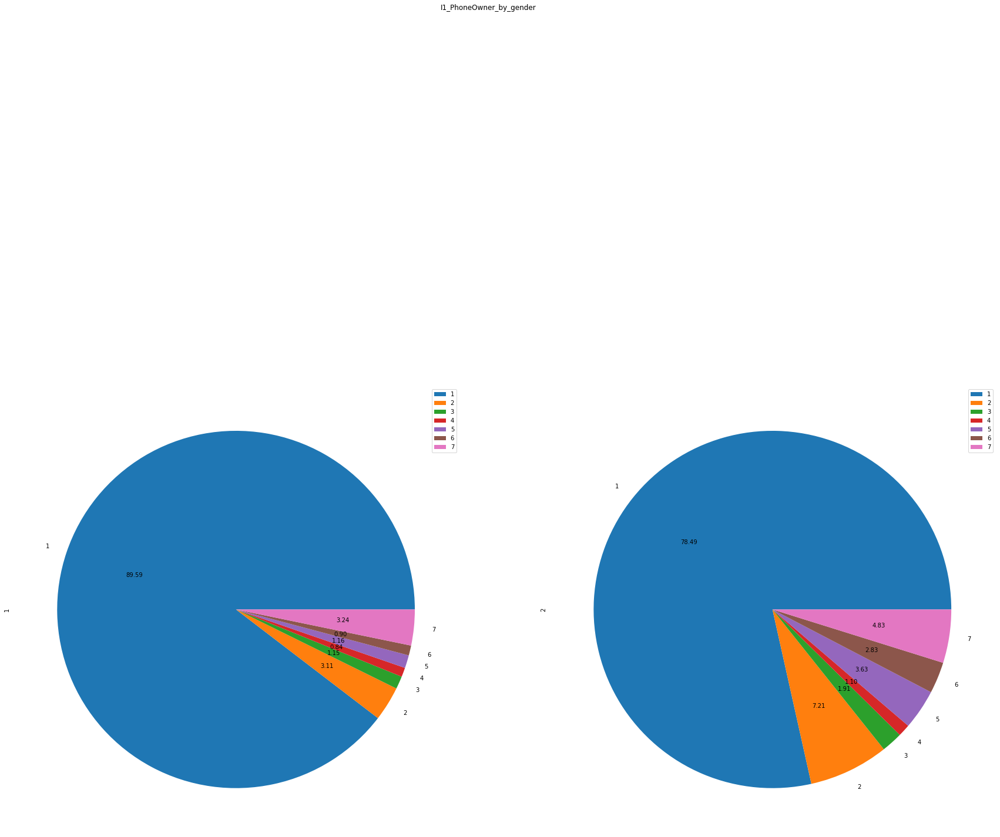

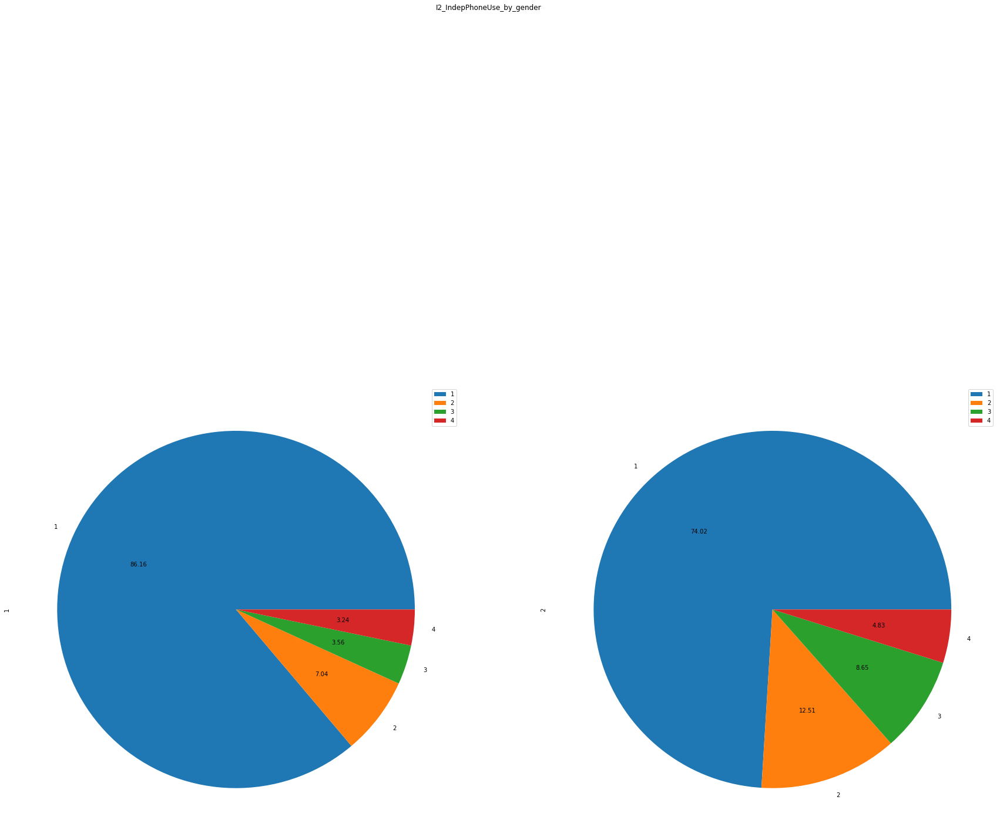

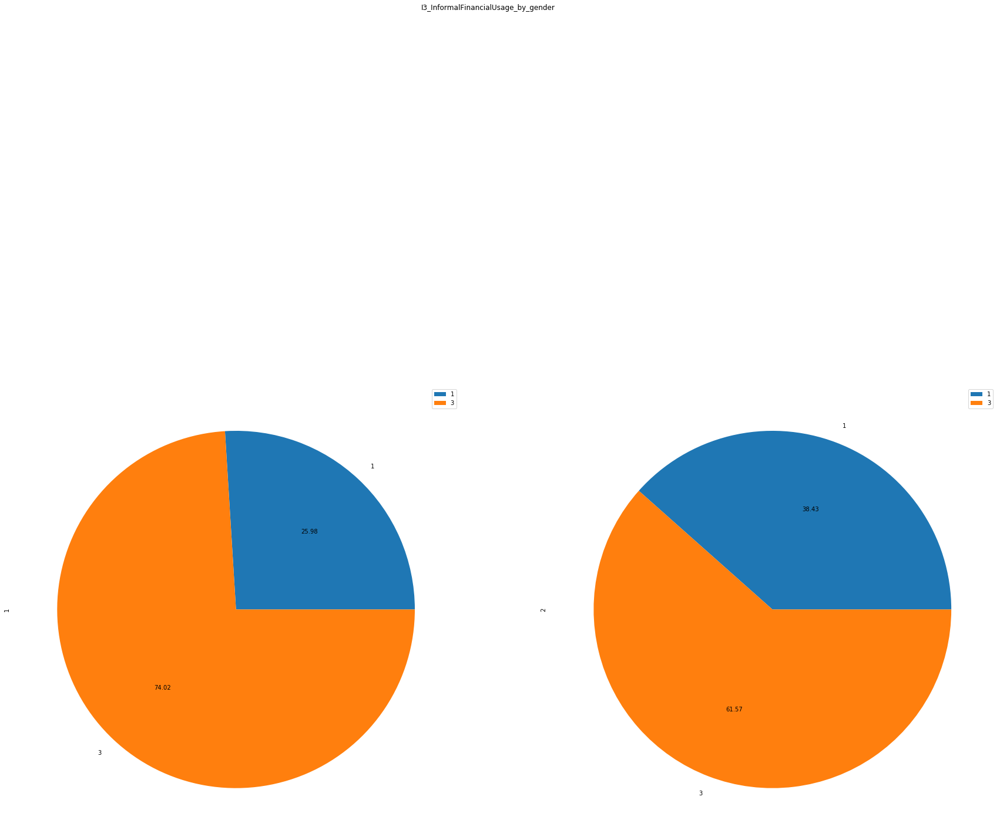

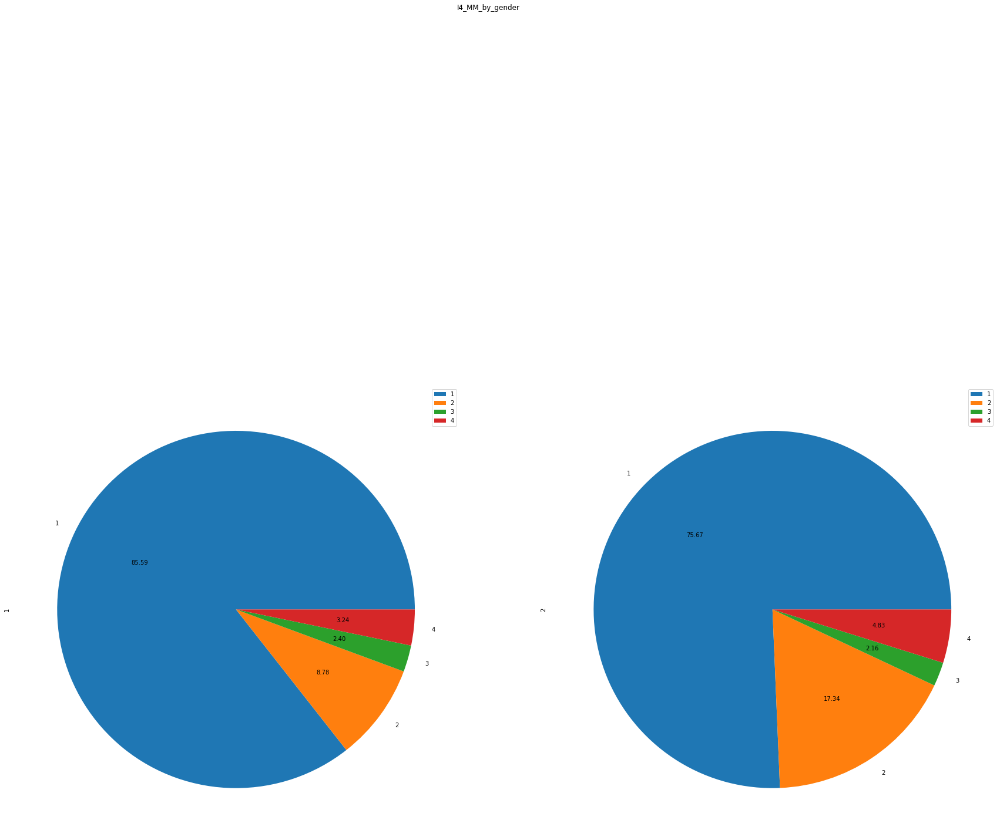

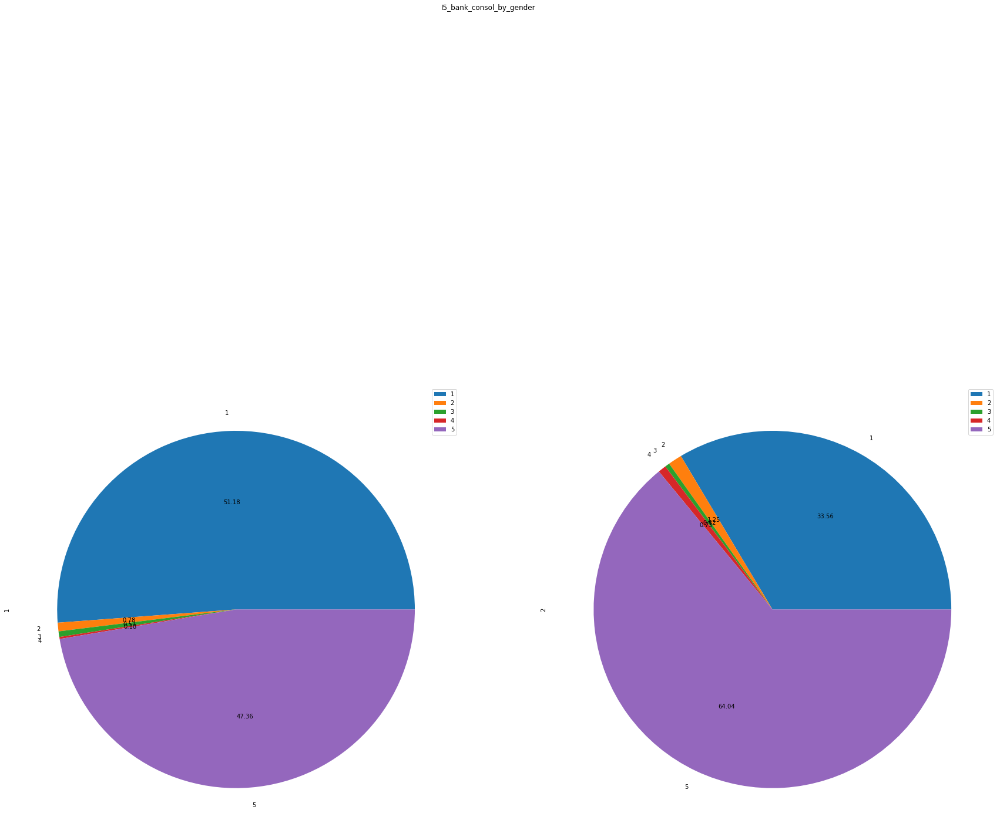

...

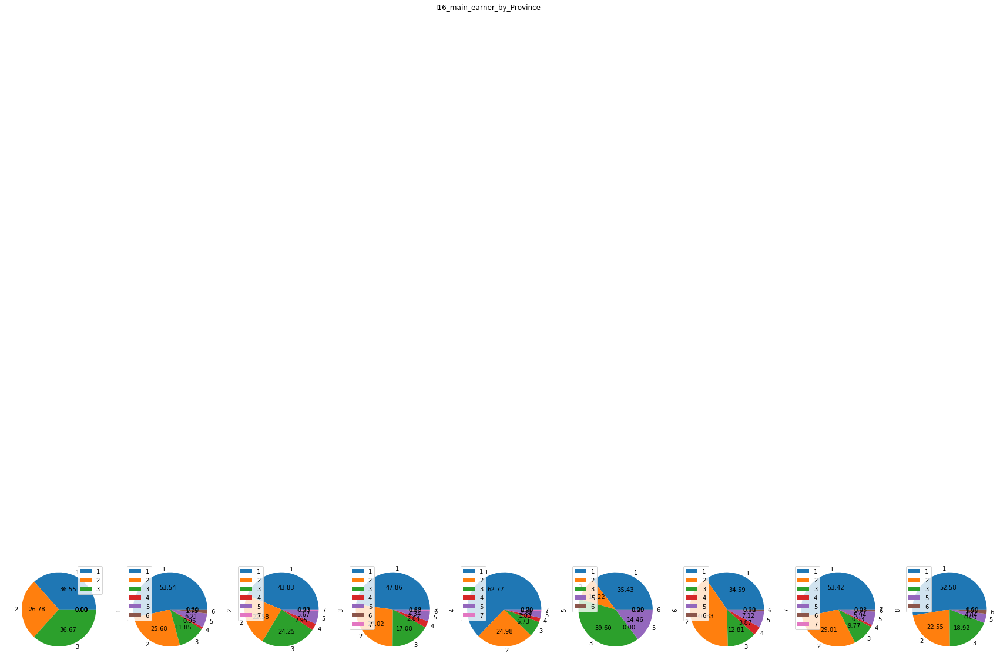

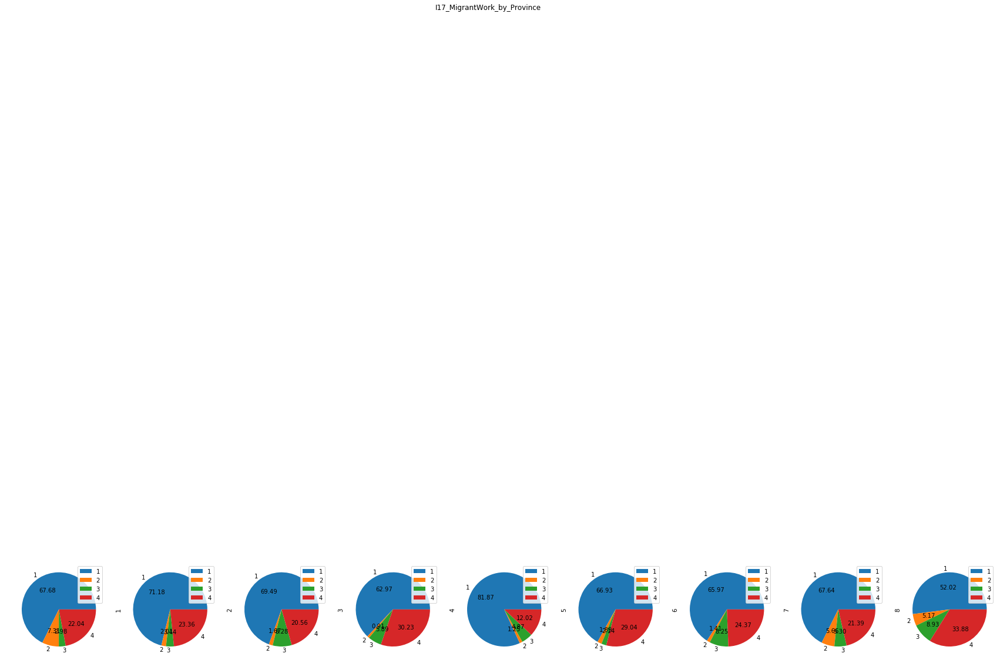

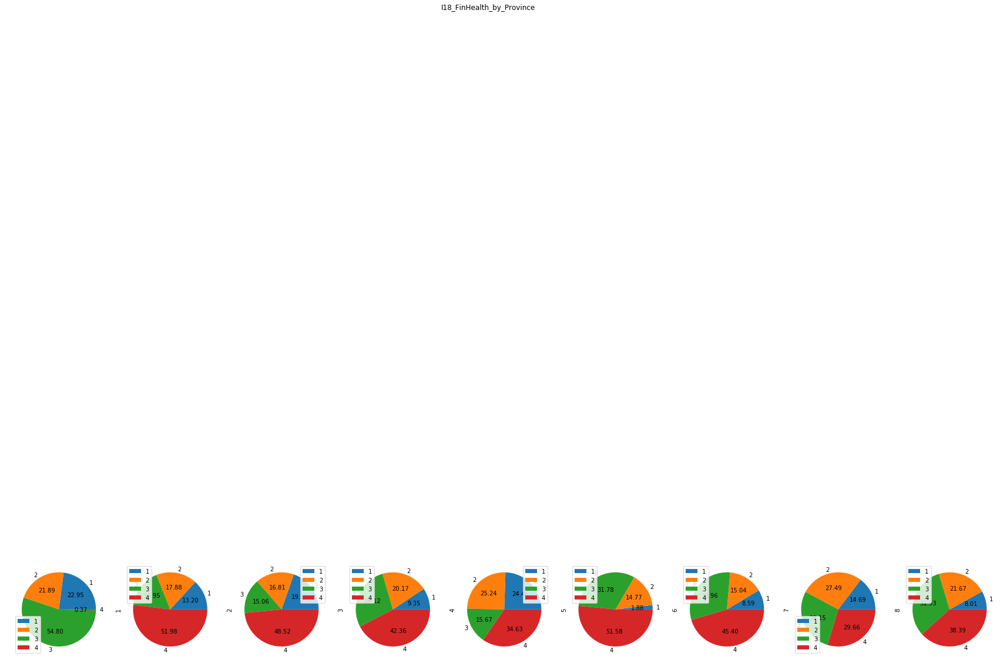

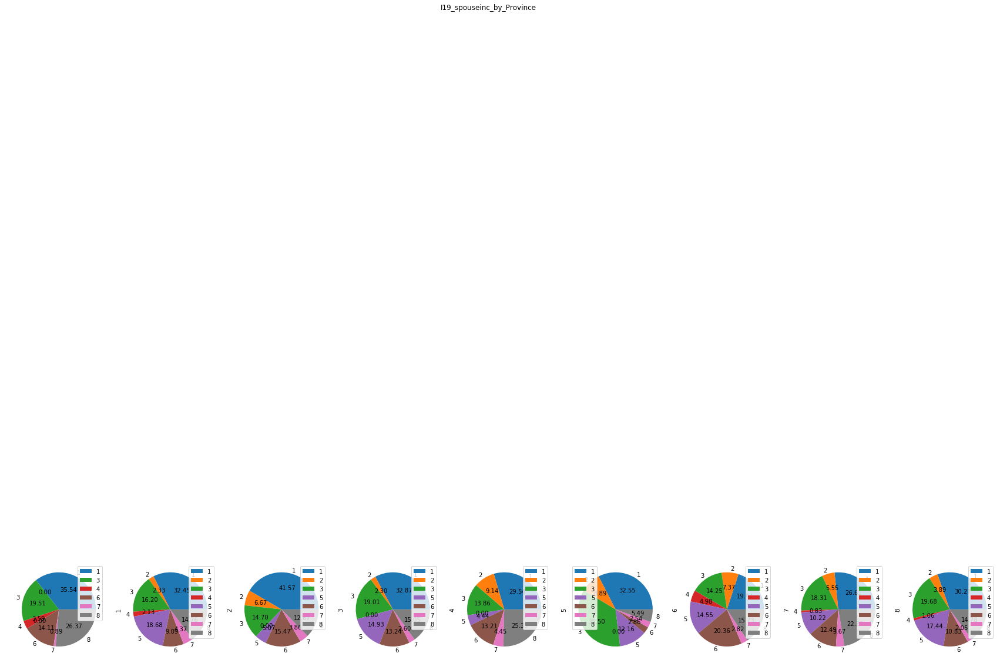

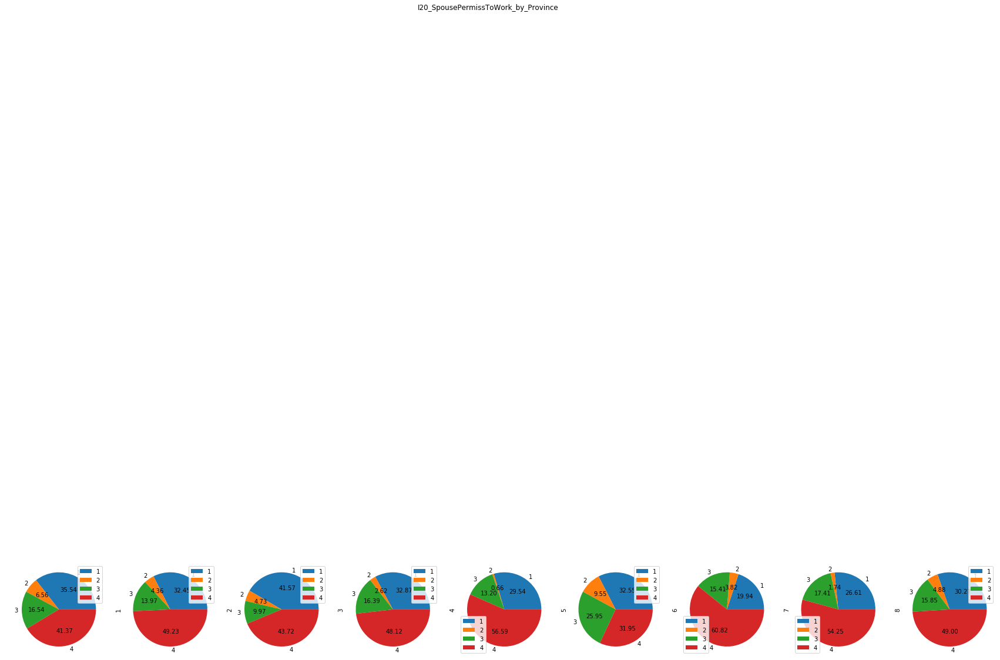

In [29]:
for ind in ['gender',
 'Relationship_status',
 'UR',
 'age_group',
 'edu_reduced',
 'literacy_binary_English',
 'own_phone',
 'ppi_cutoff',
 'HHmean',
 'Region',
 'Province']:
    for column in indCols:
        display(dataset.groupby([column,ind])['finalweight'].sum().unstack().plot.pie(subplots=True, figsize=(30, 30), autopct='%.2f', title=f'{column}_by_{ind}'))

In [22]:
catcols = [column for column in dataset if len(dataset[column].unique()) < 10]
catcols

['gender',
 'Relationship_status',
 'UR',
 'age_group',
 'edu_reduced',
 'literacy_binary_English',
 'own_phone',
 'ppi_cutoff',
 'HHmean',
 'Region',
 'Province',
 'I1_PhoneOwner',
 'I2_IndepPhoneUse',
 'I3_InformalFinancialUsage',
 'I4_MM',
 'I5_bank_consol',
 'I6_OpeningPermission',
 'I7_MoneyTaken',
 'I8_savGoalDec_consol',
 'I9_savGoalInfl',
 'I10_LandOwn',
 'I11_LandDecide',
 'I12_ChildrenDecide',
 'I13_Workfreq',
 'I14_DecideSpend',
 'I15_PermissToWork',
 'I16_main_earner',
 'I17_MigrantWork',
 'I18_FinHealth',
 'I19_spouseinc',
 'I20_SpousePermissToWork']

## to interact live with the test data

In [23]:
pivot_ui(dataset)